In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
import squidpy as sq
import anndata as ad
import scipy.stats as stats
import blitzgsea as blitz
import drug2cell as d2c
import re
from collections import OrderedDict 

In [2]:
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=pd.errors.PerformanceWarning)

In [3]:
adata = sc.read_h5ad('/Users/stephreinert/Desktop/objects/Kidney_Atlas_V2_05162024_Object.h5ad')

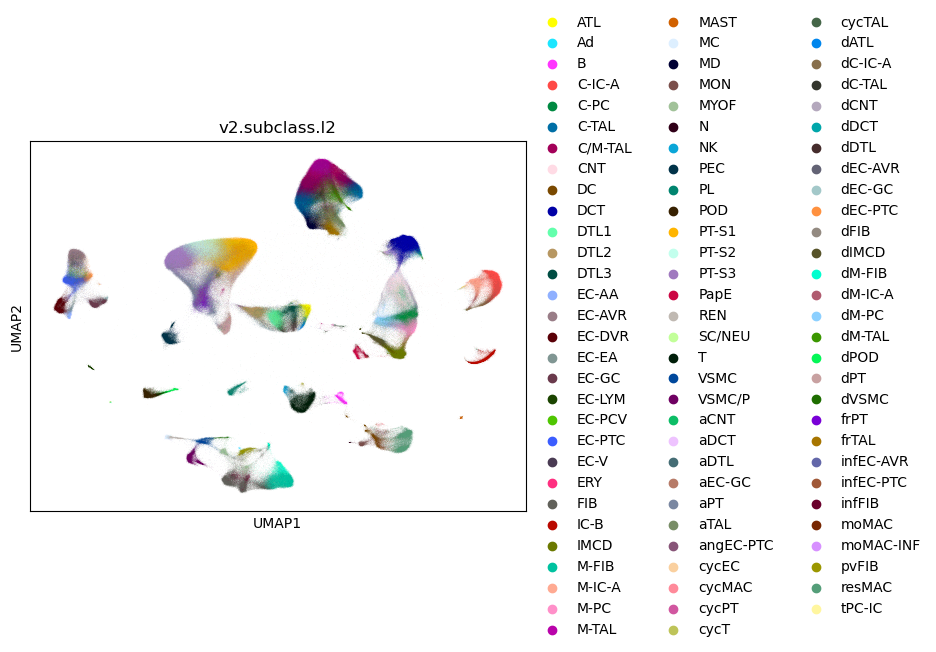

In [4]:
sc.pl.umap(adata, color = 'v2.subclass.l2')

In [5]:
# reproducibility and subsetting 

np.random.seed(42)

frac = 0.25

celltype_col = 'v2.subclass.l2'

sampled_indices = []
for celltype, df_group in adata.obs.groupby(celltype_col):
    n = len(df_group)
    k = max(1, int(n * frac))  # Ensure at least 1 cell per type
    sampled = np.random.choice(df_group.index, size=k, replace=False)
    sampled_indices.extend(sampled)

adata_sub = adata[sampled_indices].copy()

In [6]:
adata_sub

AnnData object with n_obs × n_vars = 347133 × 36588
    obs: 'library', 'nCount_RNA', 'nFeature_RNA', 'percent.er', 'percent.mt', 'v1_barcode', 'source', 'assay', 'experiment_long', 'experiment', 'patient', 'specimen', 'condition_level3', 'condition_level2', 'condition_level1', 'condition', 'percent_cortex', 'percent_medulla', 'region_level3', 'region_level2', 'region_level1', 'age_binned', 'sex', 'race', 'KDIGO_stage', 'baseline_eGFR_binned', 'proteinuria_binned', 'A1c_binned', 'albuminuria_binned', 'diabetes_history', 'diabetes_duration', 'hypertension_history', 'hypertension_duration', 'on_RAAS_blockade', 'ckd_stageC', 'adj_cm_ati.ain', 'location', 'laterality', 'protocol', 'tissue_type_full', 'tissue_type', 'atlas_version', 'v1clusters', 'v1.subclass.l3', 'v1.subclass.l2', 'v1.subclass.l1', 'v1.state.l1', 'v1.state.l2', 'v1.class', 'v1.structure', 'group', 'v2.clusters', 'v2.subclass.full', 'v2.subclass.l3', 'v2.subclass.l2', 'v2.subclass.sp', 'v2.subclass.l1', 'v2.state.l2', 'v2.s

In [7]:
# run drug2cell

d2c.score(adata_sub, use_raw=False)

### Full Dotplot

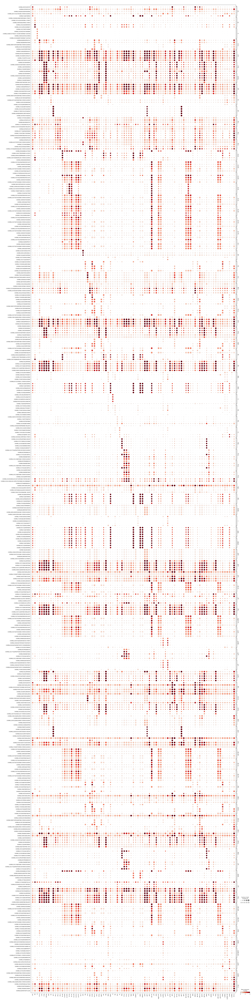

In [8]:
# full dotplot

sc.tl.rank_genes_groups(adata_sub.uns['drug2cell'], method="wilcoxon", groupby="v2.subclass.l2")
sc.pl.rank_genes_groups_dotplot(adata_sub.uns['drug2cell'], swap_axes=True, dendrogram=False, n_genes=5, vmin=0, vmax=4, save="/full_ranked_dotplot_FINAL.pdf" )

### Generate Full Excel

In [9]:
# print excel sheet with information

rgg = adata_sub.uns['drug2cell'].uns['rank_genes_groups']
groups = rgg['names'].dtype.names  
excel_dict = {}

def clean_sheet_name(name):
    return re.sub(r'[\/\\\*\?\[\]\:]', '_', name)[:31]

for group in groups:
    df = pd.DataFrame({
        'drug': rgg['names'][group],
        'logfoldchange': rgg['logfoldchanges'][group],
        'pval': rgg['pvals'][group],
        'pval_adj': rgg['pvals_adj'][group],
        'score': rgg['scores'][group],
    })
    sheet_name = clean_sheet_name(group)
    excel_dict[sheet_name] = df


with pd.ExcelWriter("FULL_drug2cell_ranked_genes_by_celltype.xlsx") as writer:
    for sheet_name, df in excel_dict.items():
        df.to_excel(writer, sheet_name=sheet_name, index=False)

### Collapsed Dot Plot

In [10]:
# collapsed dotplot with cell types in specific order

collapse_map = {
    'PT-S1': 'PT', 'PT-S2': 'PT', 'PT-S3': 'PT',
    'DTL1': 'DTL', 'DTL2': 'DTL', 'DTL3': 'DTL',
    'M-TAL': 'TAL', 'C-TAL': 'TAL', 'C/M-TAL': 'TAL',
    'dM-TAL': 'dTAL', 'dC-TAL': 'dTAL',
    'C-PC': 'PC', 'M-PC': 'PC', 'dM-PC': 'dPC',
    'C-IC-A': 'IC', 'M-IC-A': 'IC', 'IC-B': 'IC',
    'dC-IC-A': 'dIC', 'dM-IC-A': 'dIC',
    'REN': 'REN/VSMCP', 'VSMC': 'REN/VSMCP', 'VSMC/P': 'REN/VSMCP'
}

adata_sub.uns['drug2cell'].obs['cell_type_collapsed'] = (
    adata_sub.uns['drug2cell'].obs['v2.subclass.l2'].replace(collapse_map).astype(str)
)

# selected cell types, in specific order
desired_order = [
    "POD", "dPOD", "PEC", "PT", "aPT", "frPT", "dPT", "cycPT", 
    "DTL", "aDTL", "dDTL", "ATL", "dATL", "TAL", "aTAL", 
    "dTAL", "cycTAL", "DCT", "dDCT", "aDCT", "CNT", "aCNT", 
    "dCNT", "PC", "dPC", "IMCD", "dIMCD", "IC", "dIC", 
    "tPC-IC", "EC-AA", "EC-EA", 
    "M-FIB", "dM-FIB", "FIB", "MYOF", "infFIB", "MC", "REN/VSMCP"
]
present_order = [ct for ct in desired_order if ct in adata_sub.uns['drug2cell'].obs['cell_type_collapsed'].unique()]
adata_sub.uns['drug2cell'].obs['cell_type_collapsed'] = pd.Categorical(
    adata_sub.uns['drug2cell'].obs['cell_type_collapsed'],
    categories=present_order,
    ordered=True
)

# re-run ranking with new group labels
sc.tl.rank_genes_groups(
    adata_sub.uns['drug2cell'],
    method="wilcoxon",
    groupby="cell_type_collapsed"
)

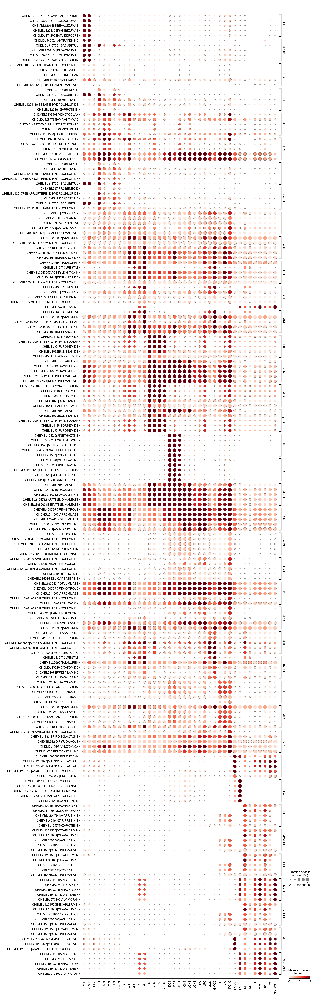

In [11]:
sc.set_figure_params(figsize=(12, 18))  
plt.rcParams.update({'ytick.labelsize': 4})  

sc.pl.rank_genes_groups_dotplot(
    adata_sub.uns['drug2cell'],
    groupby="cell_type_collapsed",
    swap_axes=True,
    dendrogram=False,
    vmin=0,
    vmax=4,
    n_genes=5,
    save="/collapsed_filtered_vmax_adjustedlabels_FINAL.pdf"
)

### Targeted Dotplot for Drugs of Interest

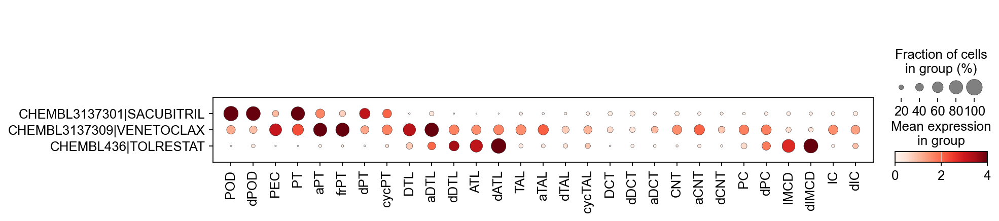

In [12]:
# create targeted dotplot for three drugs and cell types of interest

keep_celltypes = [
    "POD", "dPOD", "PEC", "PT", "aPT", "frPT", "dPT", "cycPT", 
    "DTL", "aDTL", "dDTL", "ATL", "dATL", "TAL", "aTAL", 
    "dTAL", "cycTAL", "DCT", "dDCT", "aDCT", "CNT", "aCNT", 
    "dCNT", "PC", "dPC", "IMCD", "dIMCD", "IC", "dIC"
]


adata_filtered = adata_sub.uns['drug2cell'][adata_sub.uns['drug2cell'].obs['cell_type_collapsed'].isin(keep_celltypes)].copy()

adata_filtered.obs['cell_type_collapsed'] = pd.Categorical(
    adata_filtered.obs['cell_type_collapsed'],
    categories=keep_celltypes,
    ordered=True
)

selected_drugs = [
    "CHEMBL3137301|SACUBITRIL",
    "CHEMBL3137309|VENETOCLAX",
    "CHEMBL436|TOLRESTAT"
]

sc.pl.dotplot(
    adata_filtered,
    var_names=selected_drugs,
    groupby="cell_type_collapsed",
    swap_axes=True,
    color_map="Reds",
    vmin=0,
    vmax=4,
    standard_scale=None,
    save="/collapsed_three_drugs_filtered_cells_FINAL.pdf"
)